# Import necessary libraries including opencv and gym

In [1]:

import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"
print(tf.__version__)
if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. CNNs can be very slow without a GPU.")
    if IS_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware accelerator.")
    if IS_KAGGLE:
        print("Go to Settings > Accelerator and select GPU.")

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)
tf.random.set_seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

from collections import deque

# To get smooth animations
import matplotlib.animation as animation
mpl.rc('animation', html='jshtml')

# Where to save the figures
PROJECT_ROOT_DIR = "."
SUBDIR = "rl"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", SUBDIR)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

    
def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,
def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    frames[0].shape
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim    
    
from shapely import affinity
import numpy as np 
import cv2 
import matplotlib.pyplot as plt
import PIL.Image as Image
import gym
import random
import imutils
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from gym import Env, spaces
import time
import tf_agents 
font = cv2.FONT_HERSHEY_COMPLEX_SMALL

2.7.0


# Define shaped object class to define the boundary points (as a 2d polygon) and basic movements of each navy object (move and rotate)

In [2]:
class ShapedObject(object):
    def __init__(self, name):
        self.x = 0
        self.y = 0
        self.angle=0
        self.structure=(0,0)
        self.name = name
    
    def set_shape(self, points):
        self.structure=Polygon(points)
    
    
    def rotate(self,degree):
        self.angle+=degree
        self.structure = affinity.rotate(self.structure, degree, ('center'))
        
    def move(self, del_x, del_y):
        self.x += del_x
        self.y += del_y        
        
    def move(self,vel):     
        self.x = int(np.round_(self.x +np.cos(self.angle*np.pi/180)*vel))
        self.y = int(np.round_(self.y+np.sin(self.angle*np.pi/180)*vel)) 
        self.structure = affinity.translate(self.structure,
                                            xoff=int(np.round_(np.cos(self.angle*np.pi/180)*vel)),
                                            yoff=int(np.round_(np.sin(self.angle*np.pi/180)*vel)))



# Define the agent ship class

In [3]:
class AgentShip(ShapedObject):
    def __init__(self, name,x,y,angle,vel=0):
        #initialize the super class (shaped ibject) and subclass (AgentShip) attributes
        super(AgentShip, self).__init__(name)
        self.vel=vel
        self.x=x
        self.y=y  
        
        #load and scale the agent image to be rendered on the canvas
        self.icon = cv2.imread("agent_battle_ship.png") / 255.0
        self.icon_wh=200
        self.icon_w = 40 #width in pixels
        self.icon_h = 80 #height in pixels
        w_margin=(self.icon_wh-self.icon_w)//2
        h_margin=(self.icon_wh-self.icon_h)//2 
        self.icon = cv2.resize(self.icon, (self.icon_h, self.icon_w))
        self.bg_img=np.ones([self.icon_wh,self.icon_wh,3],dtype=np.double)
        self.bg_img[w_margin:w_margin+self.icon_w,h_margin:h_margin+self.icon_h]=self.icon 
        self.icon=self.bg_img  #defines the final pixels representing the agent ship        
        
        #define polygon points representing the margin
        p=np.zeros((5,2))
        p[0]=(x-self.icon_h/2,y-self.icon_w/2)
        p[1]=(x+self.icon_h/4,y-self.icon_w/2)
        p[2]=(x+self.icon_h/2,y)
        p[3]=(x+self.icon_h/4,y+self.icon_w/2)
        p[4]=(x-self.icon_h/2,y+self.icon_w/2)        
        #set the margin points for the super class
        super().set_shape(p)     
        
        #apply rotationg to the pixels and margins based on the initial angle
        self.rotate(angle)
        
        
    def speedup(self): #apply acceleration by increasing velocity
        self.vel=min(10,self.vel+1)
        
    def slowdown(self):#apply deceleration if velocity is greater than zero
        self.vel=max(0,self.vel-1)
        
    def move(self):#move the ship based on the velocity and the angle
        super().move(self.vel)
        
    def rotate(self,degree):  #apply rotation
        super().rotate(degree)
        M = cv2.getRotationMatrix2D((self.icon_wh//2, self.icon_wh//2), self.angle, 1.0)
        self.icon = cv2.warpAffine(self.bg_img, M, (self.icon_wh, self.icon_wh))        
        
    def launch_missile(self):#launch missile
        return AgentMissile("AgentMissile", 
                            int(np.round_(self.x +np.cos(self.angle*np.pi/180)*40)),
                            int(np.round_(self.y+np.sin(self.angle*np.pi/180)*40)) , 
                            self.angle,30)


# Define the enemy ship class

In [4]:
class EnemyShip(ShapedObject):
    def __init__(self, name,x,y,angle,vel=0):
        #initialize the super class (shaped ibject) and subclass (Enemyhip) attributes
        super(EnemyShip, self).__init__(name)
        self.vel=vel
        self.x=x
        self.y=y  
        
        #load and scale the enemy ship image to be rendered on the canvas
        self.icon = cv2.imread("enemy_battle_ship.png") / 255.0
        self.icon_wh=200
        self.icon_w = 40 #width in pixels
        self.icon_h = 80 #height in pixels
        w_margin=(self.icon_wh-self.icon_w)//2
        h_margin=(self.icon_wh-self.icon_h)//2 
        self.icon = cv2.resize(self.icon, (self.icon_h, self.icon_w))
        self.bg_img=np.ones([self.icon_wh,self.icon_wh,3],dtype=np.double)
        self.bg_img[w_margin:w_margin+self.icon_w,h_margin:h_margin+self.icon_h]=self.icon 
        self.icon=self.bg_img  #defines the final pixels representing the ship        
        
        #define polygon points representing the margin
        p=np.zeros((6,2))
        p[0]=(x-self.icon_h/4,y-self.icon_w/2)
        p[1]=(x+self.icon_h/4,y-self.icon_w/2)
        p[2]=(x+self.icon_h/2,y)
        p[3]=(x+self.icon_h/4,y+self.icon_w/2)
        p[4]=(x-self.icon_h/4,y+self.icon_w/2)
        p[5]=(x-self.icon_h/2,y)        
        #set the margin points for the super class
        super().set_shape(p)     
        
        #apply rotationg to the pixels and margins based on the initial angle
        self.rotate(angle)        
        
        
    def speedup(self):
        self.vel=min(10,self.vel+1)
        
    def slowdown(self):
        self.vel=max(0,self.vel-1)
        
    def move(self):
        super().move(self.vel)
        
    def rotate(self,degree):             
        super().rotate(degree)
        M = cv2.getRotationMatrix2D((self.icon_wh//2, self.icon_wh//2), self.angle, 1.0)
        self.icon = cv2.warpAffine(self.bg_img, M, (self.icon_wh, self.icon_wh))        
        
    def launch_missile(self):
        return EnemyMissile("EnemyMissile", int(np.round_(self.x +np.cos(self.angle*np.pi/180)*40)),
                            int(np.round_(self.y+np.sin(self.angle*np.pi/180)*40)) , 
                            self.angle,10)

        

    


# Define the agent missile class

In [5]:
class AgentMissile(ShapedObject):
    def __init__(self, name,x,y,angle,vel=0):  
        super(AgentMissile, self).__init__(name)
        self.vel=vel
        self.x=x
        self.y=y  
        
        #load and scale the missile image to be rendered on the canvas
        self.icon = cv2.imread("AgentMissile.png") / 255.0
        self.icon_wh=200
        self.icon_w = 15
        self.icon_h = 30
        w_margin=(self.icon_wh-self.icon_w)//2
        h_margin=(self.icon_wh-self.icon_h)//2 
        self.icon = cv2.resize(self.icon, (self.icon_h, self.icon_w))
        self.bg_img=np.ones([self.icon_wh,self.icon_wh,3],dtype=np.double)
        self.bg_img[w_margin:w_margin+self.icon_w,h_margin:h_margin+self.icon_h]=self.icon 
        self.icon=self.bg_img  #defines the final pixels representing the missile      
        
        #define polygon points representing the margin
        p=np.zeros((5,2))
        p[0]=(x-self.icon_h/2,y-self.icon_w/2)
        p[1]=(x-self.icon_h/2.7,y-self.icon_w/2)
        p[2]=(x+self.icon_h/2,y)
        p[3]=(x-self.icon_h/2.7,y+self.icon_w/2)
        p[4]=(x-self.icon_h/2,y+self.icon_w/2)         
        #set the margin points for the super class
        super().set_shape(p)     
        
        #apply rotationg to the pixels and margins based on the initial angle
        self.rotate(angle)        
                
    def speedup(self):
        self.vel=min(10,self.vel+1)
        
    def slowdown(self):
        self.vel=max(0,self.vel-1)
        
    def move(self):
        super().move(self.vel)
        
        
    def rotate(self,degree):     
        super().rotate(degree)
        M = cv2.getRotationMatrix2D((self.icon_wh//2, self.icon_wh//2), self.angle, 1.0)
        self.icon = cv2.warpAffine(self.bg_img, M, (self.icon_wh, self.icon_wh))        
        
        
        


# Define the enemy missile class

In [6]:
class EnemyMissile(ShapedObject):
    def __init__(self, name,x,y,angle,vel=0):
        super(EnemyMissile, self).__init__(name)
        self.vel=vel
        self.x=x
        self.y=y  
        
        #load and scale the missile image to be rendered on the canvas
        self.icon = cv2.imread("EnemyMissile.png") / 255.0
        self.icon_wh=200
        self.icon_w = 15
        self.icon_h = 30
        w_margin=(self.icon_wh-self.icon_w)//2
        h_margin=(self.icon_wh-self.icon_h)//2 
        self.icon = cv2.resize(self.icon, (self.icon_h, self.icon_w))
        self.bg_img=np.ones([self.icon_wh,self.icon_wh,3],dtype=np.double)
        self.bg_img[w_margin:w_margin+self.icon_w,h_margin:h_margin+self.icon_h]=self.icon 
        self.icon=self.bg_img  #defines the final pixels representing the missile      
        
        #define polygon points representing the margin
        p=np.zeros((5,2))
        p[0]=(x-self.icon_h/2,y-self.icon_w/2)
        p[1]=(x-self.icon_h/2.7,y-self.icon_w/2)
        p[2]=(x+self.icon_h/2,y)
        p[3]=(x-self.icon_h/2.7,y+self.icon_w/2)
        p[4]=(x-self.icon_h/2,y+self.icon_w/2)            
        #set the margin points for the super class
        super().set_shape(p)     
        
        #apply rotationg to the pixels and margins based on the initial angle
        self.rotate(angle)         
                
    def speedup(self):
        self.vel=min(10,self.vel+1)
        
    def slowdown(self):
        self.vel=max(0,self.vel-1)
        
    def move(self):
        super().move(self.vel)
        
        
    def rotate(self,degree):     
        super().rotate(degree)
        M = cv2.getRotationMatrix2D((self.icon_wh//2, self.icon_wh//2), self.angle, 1.0)
        self.icon = cv2.warpAffine(self.bg_img, M, (self.icon_wh, self.icon_wh))        
        

# Define the game environment class

In [7]:
class BattleShipGame(Env):
    def __init__(self,discount=0.95):
        super().__init__()
        self._action_spec = tf_agents.specs.BoundedArraySpec(
            shape=(), dtype=np.int32, name="action", minimum=0, maximum=3)
        self._observation_spec = tf_agents.specs.BoundedArraySpec(
            shape=(120, 160, 3), dtype=np.float64, name="observation", minimum=0, maximum=1)
        self.discount = discount
        # Define a 2-D observation space
        self.observation_shape = (600, 800, 3)
        self.structure=Polygon([(0,0),(0,600),(800,600),(800,0)])
        self.observation_space = spaces.Box(low = np.zeros(self.observation_shape), 
                                            high = np.ones(self.observation_shape),
                                            dtype = np.float16)
        # Define an action space ranging from 0 to 4
        self.action_space = spaces.Discrete(4,)
                        
        # Create a canvas to render the environment images upon 
        self.canvas = np.ones(self.observation_shape) * 1
        # Define elements present inside the environment
        self.elements = []

        # Permissible area 
        self.y_min = int (self.observation_shape[0] * 0.1)
        self.x_min = 0
        self.y_max = int (600)
        self.x_max = self.observation_shape[1]


    def draw_elements_on_canvas(self):
        # Init the canvas 
        self.canvas = np.ones(self.observation_shape) * 1

        # Draw each element on canvas
        for elem in self.elements:
            if self.structure.covers(elem.structure) :
                elem_shape = elem.icon.shape
                x,y = elem.x, elem.y
                (minx, miny, maxx, maxy)=elem.structure.bounds
                (minx, miny, maxx, maxy)=(int(minx), int(miny), int(maxx), int(maxy))
                self.canvas[self.y_max-maxy:self.y_max-miny, minx:maxx] = elem.icon[elem.icon_wh-(elem.icon_wh-(maxy-miny))//2-(maxy-miny):elem.icon_wh-(elem.icon_wh-(maxy-miny))//2,(elem.icon_wh-(maxx-minx))//2:(elem.icon_wh-(maxx-minx))//2+(maxx-minx)]

            
        text = 'Rewards: {}'.format( self.ep_return)

        # Put the info on canvas 
        self.canvas = cv2.putText(self.canvas, text, (10,20), font,  
                   0.8, (0,0,0), 1, cv2.LINE_AA)


    def reset(self):
        # Reset the reward
        self.ep_return  = 0

        # Number of enemy ships
        self.enemy_count = 0

        # Determine a place to intialise the Agent in        
        x = random.randrange(int(self.observation_shape[0] * 0.15), int(self.observation_shape[0] * 0.20))
        y = random.randrange(int(self.observation_shape[1] * 0.15), int(self.observation_shape[1] * 0.30))

        # Intialise the Ship class
        self.Ship = AgentShip("AgentShip", 200,200, 0,2)

        # Intialise the elements 
        self.elements = [self.Ship]
        
        for i in range(10):
            self.elements.append(EnemyShip("EnemyShip", 600, i*50+50, 180,0))
            self.enemy_count += 1
            

        # Reset the Canvas 
        self.canvas = np.ones(self.observation_shape) * 1

        # Draw elements on the canvas
        self.draw_elements_on_canvas()


        # return the observation
        return (cv2.resize(self.canvas,(160,120)))   
    
    def render(self, mode = "human"):
        assert mode in ["human", "rgb_array"], "Invalid mode, must be either \"human\" or \"rgb_array\""
        if mode == "human":
            cv2.imshow("Game", self.canvas)
            cv2.waitKey(10)

        elif mode == "rgb_array":
            return self.canvas

    def close(self):
        cv2.destroyAllWindows()    
        
    def get_action_meanings(self):
        return {0: "leftt", 1: "right", 2: "fire",3: "accelerate",4: "decelerate"} 
    
    def step(self, action):
        # Flag that marks the termination of an episode
        done = False

        # Assert that it is a valid action 
        assert self.action_space.contains(action), "Invalid Action"

        # Reward for executing a step.
        reward = 0

        # apply the action to the Ship
        if action == 0:
            self.Ship.rotate(6)
        elif action == 1:
            self.Ship.rotate(-6)
        elif action == 2:            
            self.elements.append(self.Ship.launch_missile()) 
        elif action == 3:
            self.Ship.speedup()
        elif action == 4:
            self.Ship.slowdown()
            
        # For each elements in the Ev
        for elem in self.elements[:]:
            elem.move()
            if elem.name=="EnemyShip":
                if random.random() < 0.08:
                    self.elements.append(elem.launch_missile()) 
                for elem1 in self.elements[:]:
                    if elem1.name=="AgentMissile" and self.has_collided(elem,elem1):
                        reward+=30
                        if elem in self.elements:
                            self.elements.remove(elem)
                        if elem1 in self.elements:
                            self.elements.remove(elem1) 
                        self.enemy_count-=1
                        if self.enemy_count==0:
                            reward+=60 
                            done=True
                    elif elem1.name=="AgentShip" and self.has_collided(elem,elem1):  
                        reward-=100
                        if elem in self.elements:
                            self.elements.remove(elem)
                        if elem1 in self.elements:
                            self.elements.remove(elem1) 
                        done=True
            if elem.name=="AgentShip":
                for elem1 in self.elements[:]:
                    if elem1.name=="EnemyMissile" and self.has_collided(elem,elem1):
                        reward-=100
                        if elem in self.elements:
                            self.elements.remove(elem)
                        if elem1 in self.elements:
                            self.elements.remove(elem1) 
                        done=True
            if elem.name=="AgentMissile" or elem.name=="EnemyMissile":
                for elem1 in self.elements[:]:
                    if not(elem.name==elem1.name) and not(elem1.name=="AgentShip") and not(elem1.name=="EnemyShip") and self.has_collided(elem,elem1):
                        reward+=2
                        if elem in self.elements:
                            self.elements.remove(elem)
                        if elem1 in self.elements:
                            self.elements.remove(elem1)                        
            if not self.structure.covers(elem.structure):
                if elem.name=="AgentShip":
                    reward-=100
                    done=True
                else:
                    if elem in self.elements:
                        self.elements.remove(elem)
            if done:
                break

        # Increment the episodic return
        self.ep_return += reward

        # Draw elements on the canvas
        self.draw_elements_on_canvas()

        return cv2.resize(self.canvas,(160,120)), reward, done, []
    
    
    def has_collided(self, elem1, elem2):
        return elem1.structure.intersects(elem2.structure)   

## Create an environment instance and show the agent behaviour in case of a radom policy by playing 20 episodes

In [10]:
env = BattleShipGame()
obs = env.reset()
n_episodes=0

while n_episodes<20:
    
    
    action=env.action_space.sample() #random agent
    obs,reward,done,info=env.step(action)
    # Render the game
    env.render()
    if done == True:
        env.reset()
        n_episodes+=1

env.close()

# Define the deep Q-learning agent

In [8]:
class DQAgent:
    def __init__(self,env):
        #take as an input the environment that we wnt the agent to adapt
        self.env=env
        #define the memory buffer
        self.replay_memory = deque(maxlen=4000)
        self.input_shape=env.reset().shape
        self.n_outputs = env.action_space.n
        #define the deep convolutional model which takes an  observation and returns the Q-values of each action if applied
        #to this obsevation
        self.model = keras.models.Sequential([
                keras.layers.Conv2D(32, 8, strides=(4, 4),padding="valid", activation="elu", 
                                    input_shape=self.input_shape),
                keras.layers.Conv2D(64, 4, strides=(2, 2),padding="valid", activation="elu"),
                keras.layers.Conv2D(64, 3, strides=(1, 1),padding="valid", activation="elu"),
                keras.layers.Flatten(),
                keras.layers.Dense(512, activation="elu"),
                keras.layers.Dense(self.n_outputs)
            ])        
        #the batch size defines the amount of samples that we want the deep learning to learn their Q-values at each 
        #training step
        self.batch_size = 128
        self.discount_rate = 0.95
        #Use RMSpro gradient descent variant to teach my deep learning model
        self.optimizer = keras.optimizers.RMSprop(learning_rate=2.5e-4, rho=0.95, momentum=0.0,
                                             epsilon=0.00001, centered=True)
        #Loss function tells us how well has the deep learning model learnt its task
        self.loss_fn = keras.losses.mean_squared_error        
        
        
    #decide whether to let the deep learning play this turn or the random agent using probability epsilon    
    def epsilon_greedy_policy(self,state, epsilon=0):
        if np.random.rand() < epsilon:
            return np.random.randint(self.n_outputs)
        else:
            Q_values = self.model.predict(state[np.newaxis])
            return np.argmax(Q_values[0])
        
    #play one turn and save the observationand results in our memory buffer to teach the model later 
    def play_one_step(self,state, epsilon):
        action = self.epsilon_greedy_policy(state, epsilon)
        next_state, reward, done, info = self.env.step(action)
        self.replay_memory.append((state, action, reward, next_state, done))
        return next_state, reward, done, info        
    
    #take 128 (batch size) random samples from the buffer to teach my deep learning model to predict Q-values
    def sample_experiences(self):
        indices = np.random.randint(len(self.replay_memory), size=self.batch_size)
        batch = [self.replay_memory[index] for index in indices]
        states, actions, rewards, next_states, dones = [
            np.array([experience[field_index] for experience in batch])
            for field_index in range(5)]
        return states, actions, rewards, next_states, dones
    
    #Teach the model te estimate Q-values on the 128 random samples using the gradient descent RMSprpo variant
    def training_step(self):
        experiences = self.sample_experiences()
        states, actions, rewards, next_states, dones = experiences
        next_Q_values = self.model.predict(next_states)
        max_next_Q_values = np.max(next_Q_values, axis=1)
        target_Q_values = (rewards +
                           (1 - dones) * self.discount_rate * max_next_Q_values)
        target_Q_values = target_Q_values.reshape(-1, 1)
        mask = tf.one_hot(actions, self.n_outputs)
        with tf.GradientTape() as tape:
            all_Q_values = self.model(states)
            Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
            loss = tf.reduce_mean(self.loss_fn(target_Q_values, Q_values))
        grads = tape.gradient(loss, self.model.trainable_variables)
        self.optimizer.apply_gradients(zip(grads, self.model.trainable_variables))
        
    #train the model using by playing n_episodes 
    def train(self, n_episodes=12000):
        np.random.seed(42)
        tf.random.set_seed(42)
        self.rewards = [] 
        best_score = 0    
        steps=0        
        for episode in range(n_episodes):
            obs = self.env.reset()    
            while True:
                steps+=1
                #the probability of playing with random agent is high at the beginning of the training phase
                epsilon = max(1 - episode / (n_episodes-n_episodes//6), 0.01)
                obs, reward, done, info = self.play_one_step(obs, epsilon)
                #train the model each fourth step
                if steps > 200 and steps%4==0:
                    self.training_step()                
                if done:
                    break
            #save rewards to analyze training behaviour
            self.rewards.append(self.env.ep_return) 
            #print results
            print(self.env.ep_return) 
            print(episode)
  

# Train the agent

In [10]:
env=BattleShipGame()
agent=DQAgent(env)
agent.train()

-68
0
-96
1
-68
2
-62
3
-32
4
-30
5
-8
6
26
7
-36
8
-40
9
32
10
22
11
-66
12
28
13
-60
14
-40
15
-36
16
-64
17
-4
18
22
19
-4
20
26
21
-98
22
-36
23
-8
24
142
25
-38
26
54
27
24
28
-8
29
-2
30
-62
31
28
32
-138
33
-160
34
28
35
-8
36
-36
37
0
38
20
39
-10
40
-62
41
22
42
-40
43
-40
44
62
45
-64
46
56
47
0
48
26
49
-60
50
-92
51
-36
52
-34
53
82
54
-6
55
-92
56
120
57
-156
58
-36
59
-4
60
-62
61
52
62
-4
63
-32
64
-40
65
-4
66
-16
67
-68
68
-10
69
22
70
26
71
-28
72
30
73
-38
74
90
75
0
76
-38
77
26
78
-6
79
-66
80
-2
81
-34
82
-58
83
88
84
24
85
-6
86
-62
87
-2
88
-38
89
-32
90
28
91
-36
92
-30
93
-4
94
24
95
52
96
60
97
-4
98
-32
99
26
100
-8
101
-8
102
-90
103
-4
104
-8
105
58
106
-38
107
-70
108
24
109
2
110
22
111
-8
112
-10
113
-4
114
-26
115
0
116
-28
117
24
118
0
119
-2
120
-38
121
150
122
-10
123
-66
124
-6
125
26
126
-6
127
28
128
-32
129
6
130
24
131
120
132
-28
133
-70
134
-64
135
-8
136
-70
137
24
138
-40
139
-10
140
-38
141
-66
142
-34
143
-36
144
-36
145
-64
146
-68
147
-

-38
1089
-38
1090
34
1091
22
1092
-38
1093
-58
1094
-32
1095
-6
1096
-6
1097
-92
1098
2
1099
-6
1100
-32
1101
-38
1102
-32
1103
-64
1104
90
1105
-6
1106
-2
1107
-66
1108
-64
1109
-106
1110
-34
1111
-68
1112
-4
1113
-64
1114
-38
1115
2
1116
-98
1117
-98
1118
-2
1119
-38
1120
-34
1121
-32
1122
-2
1123
2
1124
24
1125
-32
1126
-64
1127
-36
1128
-36
1129
-92
1130
-38
1131
-36
1132
-88
1133
-8
1134
-62
1135
54
1136
-92
1137
50
1138
-34
1139
-90
1140
-34
1141
-92
1142
-36
1143
-8
1144
28
1145
8
1146
-62
1147
-66
1148
30
1149
-32
1150
-64
1151
-28
1152
-168
1153
-8
1154
-64
1155
-64
1156
24
1157
-194
1158
20
1159
-38
1160
-40
1161
0
1162
-8
1163
-70
1164
22
1165
-32
1166
28
1167
54
1168
-32
1169
-6
1170
-58
1171
-4
1172
-6
1173
-4
1174
-6
1175
-96
1176
-40
1177
-4
1178
-96
1179
-8
1180
-2
1181
24
1182
-70
1183
-10
1184
-94
1185
-38
1186
-104
1187
-58
1188
-8
1189
-66
1190
-68
1191
-32
1192
84
1193
-8
1194
-64
1195
0
1196
-30
1197
-134
1198
-62
1199
-62
1200
28
1201
0
1202
-8
1203
-62
1204
-194

-4
2052
-6
2053
26
2054
26
2055
-36
2056
-2
2057
0
2058
-8
2059
24
2060
-70
2061
86
2062
-92
2063
-32
2064
54
2065
-32
2066
-32
2067
-8
2068
-86
2069
-30
2070
-6
2071
0
2072
-2
2073
-60
2074
-6
2075
-40
2076
-2
2077
-2
2078
-102
2079
-6
2080
56
2081
54
2082
-58
2083
-36
2084
-10
2085
-8
2086
-4
2087
32
2088
-28
2089
-68
2090
-4
2091
-32
2092
4
2093
-40
2094
-2
2095
-62
2096
0
2097
-4
2098
0
2099
-4
2100
-168
2101
-32
2102
-68
2103
66
2104
-4
2105
26
2106
-30
2107
-68
2108
-70
2109
24
2110
-6
2111
-10
2112
28
2113
-4
2114
58
2115
22
2116
-40
2117
30
2118
-8
2119
-40
2120
-66
2121
82
2122
-92
2123
-68
2124
86
2125
-34
2126
28
2127
-158
2128
24
2129
26
2130
86
2131
64
2132
-68
2133
-8
2134
30
2135
58
2136
-24
2137
28
2138
-62
2139
30
2140
20
2141
-40
2142
34
2143
24
2144
26
2145
-96
2146
32
2147
-68
2148
-38
2149
-10
2150
-60
2151
-70
2152
-30
2153
-6
2154
-32
2155
-6
2156
-28
2157
-94
2158
-60
2159
-4
2160
56
2161
-6
2162
-4
2163
-64
2164
24
2165
-4
2166
-68
2167
56
2168
-96
2169
-6
2170

-36
3021
6
3022
88
3023
-32
3024
-62
3025
92
3026
-32
3027
2
3028
22
3029
52
3030
-38
3031
-90
3032
-62
3033
52
3034
-36
3035
-10
3036
112
3037
0
3038
-4
3039
-106
3040
24
3041
116
3042
-6
3043
32
3044
2
3045
-58
3046
-34
3047
144
3048
-134
3049
-32
3050
-36
3051
-8
3052
28
3053
-6
3054
-40
3055
-136
3056
-64
3057
60
3058
34
3059
34
3060
-10
3061
-66
3062
-28
3063
-40
3064
26
3065
-66
3066
-4
3067
0
3068
-68
3069
54
3070
-66
3071
64
3072
-4
3073
32
3074
60
3075
-36
3076
-30
3077
-168
3078
-32
3079
-66
3080
24
3081
-6
3082
58
3083
0
3084
-4
3085
-86
3086
-8
3087
-56
3088
60
3089
-6
3090
-56
3091
-36
3092
22
3093
-66
3094
58
3095
30
3096
34
3097
-6
3098
94
3099
-132
3100
-66
3101
-62
3102
-64
3103
-60
3104
-32
3105
0
3106
-8
3107
0
3108
-68
3109
-6
3110
54
3111
-94
3112
28
3113
22
3114
30
3115
-70
3116
116
3117
-36
3118
58
3119
-90
3120
22
3121
-66
3122
-38
3123
116
3124
24
3125
-8
3126
-28
3127
-56
3128
54
3129
82
3130
26
3131
22
3132
-38
3133
8
3134
60
3135
-82
3136
-98
3137
-2
3138
-3

-2
3994
-34
3995
-2
3996
-2
3997
-32
3998
-8
3999
-36
4000
88
4001
-66
4002
6
4003
-2
4004
-128
4005
-2
4006
30
4007
0
4008
24
4009
98
4010
-4
4011
22
4012
8
4013
-8
4014
30
4015
-36
4016
-36
4017
54
4018
80
4019
112
4020
142
4021
-4
4022
-34
4023
102
4024
0
4025
-34
4026
-40
4027
24
4028
58
4029
56
4030
-6
4031
-32
4032
-38
4033
-36
4034
-30
4035
64
4036
-6
4037
24
4038
58
4039
-30
4040
-10
4041
54
4042
-32
4043
44
4044
-10
4045
94
4046
86
4047
-6
4048
-36
4049
-36
4050
-10
4051
0
4052
-28
4053
22
4054
-26
4055
-26
4056
32
4057
-56
4058
-2
4059
-4
4060
60
4061
52
4062
112
4063
-10
4064
-2
4065
140
4066
-94
4067
-40
4068
-4
4069
4
4070
-34
4071
-34
4072
22
4073
22
4074
-64
4075
64
4076
-28
4077
0
4078
-38
4079
30
4080
-156
4081
-68
4082
-4
4083
-6
4084
-6
4085
58
4086
-6
4087
-2
4088
22
4089
32
4090
-6
4091
26
4092
126
4093
24
4094
20
4095
-62
4096
-166
4097
124
4098
70
4099
28
4100
28
4101
-2
4102
120
4103
-6
4104
114
4105
30
4106
-40
4107
24
4108
-62
4109
-2
4110
4
4111
122
4112
64
4

22
4981
84
4982
90
4983
-68
4984
56
4985
34
4986
52
4987
-56
4988
58
4989
118
4990
4
4991
-20
4992
54
4993
52
4994
-32
4995
22
4996
-166
4997
58
4998
118
4999
6
5000
84
5001
-30
5002
-4
5003
20
5004
142
5005
-56
5006
-6
5007
2
5008
-10
5009
26
5010
-66
5011
96
5012
92
5013
56
5014
-4
5015
-4
5016
-40
5017
-28
5018
28
5019
-38
5020
84
5021
58
5022
0
5023
24
5024
50
5025
-6
5026
26
5027
52
5028
126
5029
-6
5030
22
5031
-34
5032
0
5033
94
5034
4
5035
-66
5036
-32
5037
152
5038
64
5039
30
5040
-26
5041
50
5042
54
5043
120
5044
-40
5045
128
5046
-24
5047
-4
5048
-66
5049
26
5050
26
5051
88
5052
116
5053
178
5054
4
5055
58
5056
90
5057
22
5058
22
5059
116
5060
58
5061
120
5062
-32
5063
36
5064
-6
5065
-28
5066
-4
5067
30
5068
116
5069
-38
5070
34
5071
-36
5072
-164
5073
-28
5074
-94
5075
-36
5076
-28
5077
-4
5078
-38
5079
-30
5080
-66
5081
36
5082
-70
5083
-68
5084
34
5085
86
5086
38
5087
128
5088
0
5089
-38
5090
-32
5091
-8
5092
-56
5093
94
5094
-54
5095
58
5096
80
5097
-84
5098
86
5099
-4


152
5966
24
5967
64
5968
62
5969
-6
5970
-4
5971
22
5972
24
5973
54
5974
-40
5975
-10
5976
-28
5977
90
5978
58
5979
24
5980
-38
5981
-10
5982
26
5983
-8
5984
-2
5985
54
5986
54
5987
50
5988
86
5989
28
5990
22
5991
-6
5992
-10
5993
-32
5994
-68
5995
-6
5996
-40
5997
54
5998
76
5999
26
6000
58
6001
-2
6002
-62
6003
84
6004
-22
6005
-24
6006
32
6007
76
6008
-34
6009
134
6010
84
6011
100
6012
170
6013
86
6014
84
6015
56
6016
116
6017
-100
6018
22
6019
26
6020
20
6021
120
6022
50
6023
32
6024
56
6025
22
6026
2
6027
64
6028
-32
6029
-36
6030
-32
6031
6
6032
24
6033
88
6034
-56
6035
24
6036
64
6037
50
6038
-8
6039
-30
6040
60
6041
6
6042
-4
6043
-4
6044
-64
6045
-32
6046
142
6047
-10
6048
-26
6049
-10
6050
-10
6051
-6
6052
50
6053
64
6054
22
6055
-32
6056
112
6057
-4
6058
60
6059
22
6060
-2
6061
8
6062
118
6063
-36
6064
-36
6065
28
6066
-10
6067
-10
6068
120
6069
60
6070
126
6071
68
6072
22
6073
114
6074
-2
6075
-8
6076
38
6077
34
6078
-28
6079
32
6080
36
6081
-38
6082
90
6083
-138
6084
30
60

-6
6956
22
6957
-6
6958
-2
6959
22
6960
124
6961
-4
6962
6
6963
162
6964
-4
6965
-38
6966
0
6967
26
6968
26
6969
24
6970
30
6971
88
6972
-108
6973
58
6974
84
6975
50
6976
164
6977
72
6978
86
6979
52
6980
62
6981
-8
6982
-2
6983
-36
6984
54
6985
100
6986
22
6987
94
6988
60
6989
66
6990
34
6991
32
6992
-10
6993
2
6994
-4
6995
-4
6996
-8
6997
58
6998
92
6999
82
7000
22
7001
64
7002
86
7003
2
7004
48
7005
-66
7006
66
7007
56
7008
-34
7009
54
7010
-140
7011
148
7012
30
7013
4
7014
-40
7015
84
7016
58
7017
62
7018
118
7019
120
7020
114
7021
20
7022
12
7023
122
7024
90
7025
8
7026
40
7027
-8
7028
60
7029
32
7030
28
7031
154
7032
84
7033
62
7034
2
7035
28
7036
-44
7037
26
7038
0
7039
66
7040
28
7041
92
7042
-6
7043
-8
7044
14
7045
26
7046
24
7047
54
7048
26
7049
0
7050
124
7051
92
7052
56
7053
166
7054
124
7055
130
7056
90
7057
0
7058
82
7059
60
7060
122
7061
124
7062
54
7063
-64
7064
-8
7065
38
7066
62
7067
-6
7068
26
7069
94
7070
22
7071
28
7072
-6
7073
88
7074
36
7075
54
7076
90
7077
-6
707

60
7947
38
7948
54
7949
122
7950
88
7951
110
7952
30
7953
58
7954
-4
7955
66
7956
60
7957
6
7958
70
7959
126
7960
64
7961
-52
7962
30
7963
2
7964
62
7965
96
7966
88
7967
28
7968
56
7969
128
7970
156
7971
90
7972
-36
7973
84
7974
28
7975
100
7976
96
7977
90
7978
24
7979
-6
7980
120
7981
56
7982
60
7983
96
7984
6
7985
122
7986
54
7987
178
7988
30
7989
112
7990
34
7991
26
7992
150
7993
30
7994
64
7995
-4
7996
-4
7997
-6
7998
-92
7999
26
8000
-10
8001
2
8002
24
8003
270
8004
-24
8005
-2
8006
180
8007
28
8008
28
8009
32
8010
128
8011
166
8012
92
8013
22
8014
26
8015
70
8016
218
8017
44
8018
58
8019
100
8020
6
8021
-34
8022
-28
8023
16
8024
26
8025
94
8026
24
8027
4
8028
6
8029
-60
8030
-30
8031
-34
8032
54
8033
52
8034
-28
8035
64
8036
-8
8037
0
8038
122
8039
148
8040
56
8041
148
8042
60
8043
82
8044
10
8045
-2
8046
160
8047
146
8048
92
8049
34
8050
54
8051
62
8052
116
8053
116
8054
-58
8055
-36
8056
70
8057
68
8058
84
8059
26
8060
4
8061
30
8062
68
8063
-6
8064
10
8065
54
8066
22
8067
-64


124
8931
0
8932
70
8933
134
8934
118
8935
-2
8936
60
8937
96
8938
144
8939
60
8940
96
8941
92
8942
150
8943
154
8944
118
8945
118
8946
10
8947
64
8948
116
8949
140
8950
126
8951
158
8952
166
8953
370
8954
72
8955
122
8956
34
8957
52
8958
60
8959
170
8960
128
8961
-24
8962
176
8963
144
8964
88
8965
94
8966
62
8967
34
8968
120
8969
-36
8970
0
8971
26
8972
88
8973
54
8974
118
8975
42
8976
6
8977
88
8978
122
8979
34
8980
64
8981
62
8982
156
8983
60
8984
0
8985
30
8986
372
8987
52
8988
142
8989
28
8990
-36
8991
122
8992
170
8993
114
8994
8
8995
150
8996
92
8997
164
8998
96
8999
56
9000
102
9001
132
9002
126
9003
150
9004
98
9005
108
9006
118
9007
114
9008
146
9009
120
9010
-8
9011
50
9012
42
9013
54
9014
50
9015
8
9016
154
9017
64
9018
58
9019
-12
9020
-28
9021
132
9022
72
9023
8
9024
58
9025
40
9026
62
9027
34
9028
90
9029
154
9030
64
9031
92
9032
58
9033
30
9034
124
9035
-2
9036
58
9037
112
9038
132
9039
132
9040
64
9041
150
9042
-6
9043
96
9044
116
9045
86
9046
72
9047
88
9048
116
9049
-

122
9900
90
9901
116
9902
120
9903
88
9904
108
9905
152
9906
148
9907
162
9908
96
9909
128
9910
402
9911
156
9912
152
9913
366
9914
66
9915
184
9916
150
9917
94
9918
116
9919
106
9920
96
9921
118
9922
140
9923
48
9924
170
9925
98
9926
160
9927
102
9928
92
9929
124
9930
202
9931
148
9932
120
9933
46
9934
72
9935
158
9936
80
9937
60
9938
132
9939
194
9940
66
9941
154
9942
22
9943
18
9944
58
9945
372
9946
388
9947
112
9948
126
9949
366
9950
92
9951
136
9952
20
9953
128
9954
398
9955
124
9956
126
9957
194
9958
74
9959
128
9960
116
9961
178
9962
86
9963
100
9964
122
9965
102
9966
124
9967
124
9968
92
9969
116
9970
150
9971
92
9972
38
9973
36
9974
150
9975
150
9976
116
9977
126
9978
158
9979
120
9980
32
9981
90
9982
122
9983
150
9984
86
9985
90
9986
96
9987
88
9988
118
9989
60
9990
186
9991
186
9992
136
9993
130
9994
126
9995
296
9996
96
9997
112
9998
112
9999
190
10000
64
10001
96
10002
98
10003
148
10004
66
10005
126
10006
116
10007
128
10008
70
10009
62
10010
92
10011
162
10012
148
10013


122
10763
136
10764
52
10765
88
10766
124
10767
124
10768
78
10769
166
10770
106
10771
40
10772
90
10773
122
10774
152
10775
110
10776
128
10777
122
10778
132
10779
98
10780
124
10781
70
10782
174
10783
-60
10784
166
10785
100
10786
126
10787
166
10788
56
10789
96
10790
104
10791
122
10792
-2
10793
124
10794
38
10795
158
10796
118
10797
126
10798
154
10799
124
10800
150
10801
164
10802
126
10803
146
10804
136
10805
98
10806
70
10807
128
10808
122
10809
32
10810
112
10811
62
10812
98
10813
56
10814
162
10815
130
10816
144
10817
62
10818
110
10819
44
10820
64
10821
122
10822
60
10823
122
10824
150
10825
176
10826
160
10827
98
10828
106
10829
46
10830
372
10831
98
10832
32
10833
262
10834
56
10835
150
10836
58
10837
60
10838
62
10839
126
10840
116
10841
94
10842
122
10843
50
10844
182
10845
118
10846
92
10847
112
10848
158
10849
28
10850
86
10851
98
10852
116
10853
76
10854
212
10855
162
10856
-8
10857
244
10858
118
10859
150
10860
118
10861
120
10862
98
10863
194
10864
152
10865
154
1086

128
11611
-8
11612
28
11613
150
11614
162
11615
152
11616
60
11617
84
11618
64
11619
30
11620
150
11621
84
11622
42
11623
120
11624
58
11625
-46
11626
126
11627
70
11628
-30
11629
96
11630
8
11631
184
11632
62
11633
114
11634
158
11635
86
11636
128
11637
120
11638
124
11639
24
11640
-6
11641
124
11642
140
11643
80
11644
132
11645
38
11646
156
11647
34
11648
132
11649
154
11650
150
11651
68
11652
66
11653
40
11654
68
11655
28
11656
144
11657
108
11658
130
11659
160
11660
138
11661
156
11662
60
11663
74
11664
64
11665
190
11666
148
11667
136
11668
124
11669
110
11670
62
11671
122
11672
80
11673
94
11674
92
11675
114
11676
28
11677
8
11678
38
11679
138
11680
138
11681
122
11682
38
11683
98
11684
126
11685
188
11686
100
11687
122
11688
116
11689
118
11690
86
11691
158
11692
374
11693
130
11694
174
11695
38
11696
56
11697
-170
11698
160
11699
166
11700
-30
11701
54
11702
124
11703
190
11704
112
11705
86
11706
118
11707
92
11708
156
11709
88
11710
152
11711
88
11712
56
11713
148
11714
126
11

# Plot the rewards from the training phase

Saving figure dqn_rewards_plot


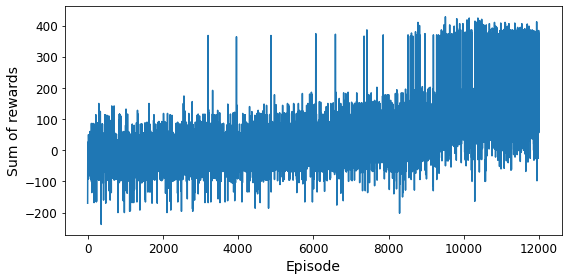

In [15]:

plt.figure(figsize=(8, 4))

plt.plot(agent.rewards)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Sum of rewards", fontsize=14)
save_fig("dqn_rewards_plot")
plt.show()

# Record performance of random agent

In [13]:

state = env.reset()

frames_random_agent = []
n_episodes=0

while n_episodes<5:
    
    action = agent.epsilon_greedy_policy(state,1) #random agent
    state, reward, done, info = env.step(action)
    if done:
        env.reset()
        n_episodes+=1
    img = env.render(mode="rgb_array")
    frames_random_agent.append(img)
    
plot_animation(frames_random_agent)

# Record performance of AI agent to compare

In [14]:

state = env.reset()

frames_AI = []
n_episodes=0

while n_episodes<5:
    
    action = agent.epsilon_greedy_policy(state) #AI agent
    state, reward, done, info = env.step(action)
    if done:
        env.reset()
        n_episodes+=1
    img = env.render(mode="rgb_array")
    frames_AI.append(img)
    
plot_animation(frames_AI)

In [12]:
agent.model.save_weights('/Models/BattleShip_AI_agent_weights')